In [0]:
access_key = ''
secret_key = ''
encoded_secret_key = secret_key.replace("/", "%2F")
aws_bucket_name = "imdb-project-kc"
mount_name = "s3dataread"
dbutils.fs.mount(f"s3a://{access_key}:{encoded_secret_key}@{aws_bucket_name}", f"/mnt/{mount_name}")

---------------------------------------------------------------------------
ExecutionError                            Traceback (most recent call last)
File <command-1828243606444623>:6
      4 aws_bucket_name = "imdb-project-kc"
      5 mount_name = "s3dataread"
----> 6 dbutils.fs.mount(f"s3a://{access_key}:{encoded_secret_key}@{aws_bucket_name}", f"/mnt/{mount_name}")

File /databricks/python_shell/dbruntime/dbutils.py:362, in DBUtils.FSHandler.prettify_exception_message.<locals>.f_with_exception_handling(*args, **kwargs)
    360 exc.__context__ = None
    361 exc.__cause__ = None
--> 362 raise exc

ExecutionError: An error occurred while calling o422.mount.
: java.rmi.RemoteException: java.lang.IllegalArgumentException: requirement failed: Directory already mounted: /mnt/s3dataread; nested exception is: 
	java.lang.IllegalArgumentException: requirement failed: Directory already mounted: /mnt/s3dataread
	at com.databricks.backend.daemon.data.client.DbfsClient.send0(DbfsClient.scala:1

In [0]:
display(dbutils.fs.ls(f"/mnt/{mount_name}"))

path,name,size,modificationTime
dbfs:/mnt/s3dataread/curated/,curated/,0,0
dbfs:/mnt/s3dataread/landing/,landing/,0,0
dbfs:/mnt/s3dataread/models/,models/,0,0
dbfs:/mnt/s3dataread/raw/,raw/,0,0
dbfs:/mnt/s3dataread/trusted/,trusted/,0,0


In [0]:
# Read the business data from s3
file_location_business = "dbfs:/mnt/s3dataread/landing/yelp_academic_dataset_business.json"
df_business = spark.read.json(file_location_business)
display(df_business)

address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state
"1616 Chapala St, Ste 2","List(null, null, null, null, null, null, null, null, null, null, null, True, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null)",Pns2l4eNsfO8kk83dixA6A,"Doctors, Traditional Chinese Medicine, Naturopathic/Holistic, Acupuncture, Health & Medical, Nutritionists",Santa Barbara,null,0,34.4266787,-119.7111968,"Abby Rappoport, LAC, CMQ",93101,7,5.0,CA
87 Grasso Plaza Shopping Center,"List(null, null, null, null, null, null, null, null, null, True, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null)",mpf3x-BjTdTEA3yCZrAYPw,"Shipping Centers, Local Services, Notaries, Mailbox Centers, Printing Services",Affton,"List(8:0-18:30, 0:0-0:0, 8:0-14:0, null, 8:0-18:30, 8:0-18:30, 8:0-18:30)",1,38.551126,-90.335695,The UPS Store,63123,15,3.0,MO
5255 E Broadway Blvd,"List(null, null, null, null, null, null, null, True, null, True, {'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}, False, False, False, null, null, False, null, null, null, null, null, False, False, null, null, null, False, null, null, False, null, 2, False, null, False, null, True, u'no')",tUFrWirKiKi_TAnsVWINQQ,"Department Stores, Shopping, Fashion, Home & Garden, Electronics, Furniture Stores",Tucson,"List(8:0-23:0, 8:0-22:0, 8:0-23:0, 8:0-22:0, 8:0-22:0, 8:0-22:0, 8:0-22:0)",0,32.223236,-110.880452,Target,85711,22,3.5,AZ
935 Race St,"List(null, null, u'none', null, null, null, null, True, null, False, {'garage': False, 'street': True, 'validated': False, 'lot': False, 'valet': False}, False, True, null, null, null, null, null, null, null, null, null, null, null, null, null, null, False, null, null, False, null, 1, null, null, True, null, null, u'free')",MTSW4McQd7CbVtyjqoe9mw,"Restaurants, Food, Bubble Tea, Coffee & Tea, Bakeries",Philadelphia,"List(7:0-21:0, 7:0-20:0, 7:0-21:0, 7:0-21:0, 7:0-20:0, 7:0-20:0, 7:0-20:0)",1,39.9555052,-75.1555641,St Honore Pastries,19107,80,4.0,PA
101 Walnut St,"List(null, null, null, null, null, null, null, True, null, True, {'garage': None, 'street': None, 'validated': None, 'lot': True, 'valet': False}, null, False, null, null, null, null, null, null, True, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, True, null, True, null)",mWMc6_wTdE0EUBKIGXDVfA,"Brewpubs, Breweries, Food",Green Lane,"List(12:0-22:0, null, 12:0-22:0, 12:0-18:0, 16:0-22:0, null, 14:0-22:0)",1,40.3381827,-75.4716585,Perkiomen Valley Brewery,18054,13,4.5,PA
615 S Main St,"List(null, null, u'none', None, null, null, null, False, null, True, None, False, False, False, null, null, False, True, null, True, null, null, False, True, null, null, null, True, u'casual', null, True, True, 1, False, False, True, null, True, u'no')",CF33F8-E6oudUQ46HnavjQ,"Burgers, Fast Food, Sandwiches, Food, Ice Cream & Frozen Yogurt, Restaurants",Ashland City,"List(9:0-0:0, 0:0-0:0, 9:0-22:0, 8:0-22:0, 6:0-22:0, 6:0-22:0, 6:0-22:0)",1,36.269593,-87.058943,Sonic Drive-In,37015,6,2.0,TN
"8522 Eager Road, Dierbergs Brentwood Point","List(null, null, null, null, null, null, null, True, null, True, {'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, null, 2, null, null, null, null, null, null)",n_0UpQx1hsNbnPUSlodU8w,"Sporting Goods, Fashion, Shoe Stores, Shopping, Sports Wear, Accessories",Brentwood,"List(10:0-18:0, 0:0-0:0, 10:0-18:0, 12:0-18:0, 10:0-18:0, 10:0-18:0, 10:0-18:0)",1,38.627695,-90.340465,Famous Footwear,63144,13,2.5,MO
400 Pasadena Ave S,null,qkRM_2X51Yqxk3btlwAQIg,"Synagogues, Religious O

In [0]:
# Convert to dataframe
df_business = df_business.toPandas()

In [0]:
# Get number of columns and rows
print(df_business.shape)

(150346, 14)


In [0]:
# Get all columns names
print(df_business.columns)

Index(['address', 'attributes', 'business_id', 'categories', 'city', 'hours',
       'is_open', 'latitude', 'longitude', 'name', 'postal_code',
       'review_count', 'stars', 'state'],
      dtype='object')


In [0]:
# Find missing value
print(df_business.isna().sum())

address             0
attributes      13744
business_id         0
categories        103
city                0
hours           23223
is_open             0
latitude            0
longitude           0
name                0
postal_code         0
review_count        0
stars               0
state               0
dtype: int64


In [0]:
# Get statistics of all numerical columns
print(df_business.describe())

            is_open       latitude      longitude   review_count  \
count  150346.00000  150346.000000  150346.000000  150346.000000   
mean        0.79615      36.671150     -89.357339      44.866561   
std         0.40286       5.872759      14.918502     121.120136   
min         0.00000      27.555127    -120.095137       5.000000   
25%         1.00000      32.187293     -90.357810       8.000000   
50%         1.00000      38.777413     -86.121179      15.000000   
75%         1.00000      39.954036     -75.421542      37.000000   
max         1.00000      53.679197     -73.200457    7568.000000   

               stars  
count  150346.000000  
mean        3.596724  
std         0.974421  
min         1.000000  
25%         3.000000  
50%         3.500000  
75%         4.500000  
max         5.000000  


In [0]:
import matplotlib.pyplot as plt

Out[22]: (array([ 1986.,  4932.,  9527., 14316.,     0., 18453., 26519., 31125.,
        27181., 16307.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <BarContainer object of 10 artists>)

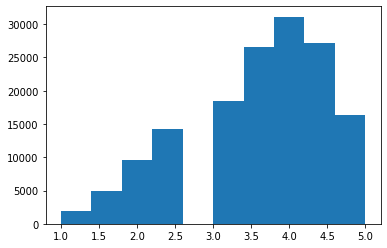

In [0]:
# Plot a histogram of the stars column
plt.hist(df_business['stars'])

In [0]:
# Read the user data from s3
file_location_user = "dbfs:/mnt/s3dataread/landing/yelp_academic_dataset_user.json"
df_user = spark.read.json(file_location_user)
display(df_user)

average_stars compliment_cool compliment_cute compliment_funny compliment_hot compliment_list compliment_more compliment_note compliment_photos compliment_plain compliment_profile compliment_writer cool elite fans friends funny name review_count useful user_id yelping_since 3.91 467 56 467 250 18 65 232 180 844 55 239 5994 2007 267 NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA, EjlCGf14tYMPJ0rsrL703w, 7OagHIAKx2Rm9z3CQ0OmvA, uZoFvKs0dahfffIqHQf1eA, TW7-U8Y_SYsAX91Ol5LlfA, 6EDA76lfkaTyOeuxkg0Fmw, MsTKApUX1VF2Mv9jpUIG5g, Rq4TAwX8vj0Ccc3Pt0mJ5g, P77zKKIP9xyakKLRutvdAQ, pOqaU6X1xyWUoYJJdoqbBw, 1aU0r7X2luo9P8hfSpq6ng, 7XDyuBY0mhLsaGqjquh8rw, KrnJZsROH6jsiCN_RHG_8Q, 48zQrAJNOqcKJJgqU5WzbQ, 48wN4GpyJ7hPy4uuwpGFmw, z8zzFMKCnavBY5_-_vzi9w, BemKKkZBBmu9GupEwKBj9g, vVS0rY7uZ2UZ6bdsDzSPIQ, hc6-o0VhNPw3qR3Pv7Knmg, 2AOUvDvG7rvAX1hLI5QZKA, dKzMVnYh_tvIQbDm6pTlRA, ACHQbmN7OMTY6PFz5Sl4_g, 8hqS8Wul46dt370JVRA83Q, TMLVzNYs-zwwREudyvI08A, 36LgEtwt6ROhrCtuPjfRmQ, -f6amuvfIVS7VX65BqZ6pQ, kCjFwGXHxUTaJ23p70j86w, d9J7e2uo-a0S0XMuw1CS-A, dbrGVOcscXUQjQGi_0bnaQ, a_luWCTl-TLAgvsgfn8dfw, -cnGMlaftdo8HGVrQwKE3Q, p2ww1kRTv0z9dT3gZYcDkg, 3gE3_MDUsCg-Tay4t1R5nA, uJ2LwqzRgBf_klkVaXh4Ig, T_7gdLtmEvQgNGUoo9Wa4A, -_QbHsgT5VBnC0LCeiFhWg, exGR1gKBGqxO22d6bAiB1g, L_hkq91-wOSrI5wX1RU5og, cH8BtsTcwziAFTnAz7jjCg, FQCVWJV442bwSIbdUPPpDg, YerLN4IUmp_nX0s272Z94w, 4O35_CubYIvkYc6YJaQ2NA, SRnCpcuVZlj6EAa8B51oLg, grl9kJisOsj_uztyMuejdw, zlqbbhAujrMla0eDiK7mIw, zcQ2Xlh2wf5gB1WKUegjBw, 0XIlJuZ1kQYMWsiduJuSPA, b7Jqj_NVXoLT9lYXq0Jd8A, -AsU15jw64vw1o5gCievpQ, cgEo4YQIOhhP3QDDV7RlMQ, dH3zvrOAOZXBEGIPC3kO9Q, xqVz42BnYuzQ5mWZ22eTvA, Ly_8f0QTomu-8d_fohPPnA, PcOR20-BMQGGC7AHRlpXXw, 60KUnvEUvXP3mXPY7ByRmA, mRpS0gpq2ae9a4aPRhEnFg, OLOCVi0PqJUdpUuIj4i70g, OzXPjzc9Bd4SxpxRSrWARg, R4-pExA_mCWtcofrNuByEQ, eK_WsysVcEpgLRcKxxMw5Q, TLUkAUeo_kwH3qM80IKGMQ, MiZYWZKC28xofz3yrZ-tRQ, pbPWufGYwu2c4BAHbORm6Q, nZ-qPTmanU8iIHcN84NG0w, uJ75W39QMMNNP6idCviLWA, 0bu8Ycte6DFk2vf9Y5Y4Ng, wgKf4RAe9I4UL2eCuQSYGA, oDDhXD1Nxv1_zByrc5Y3sw, CWaFyxu0CgNJOIvBMOBYHA, 0mdh1mokAAZSMibcAaXUEg, eWxqSmCGbxItRzT6v1SxLw, 6Y-7TX7I-4MVQR1wU3MyPg, Hg9dHsCdvG87z5EOOdxL0g, JP5uWDM3RmYF4GOzh0lobw, MglYdrDvZH2Ei9W4kq0NPg, b74oX-FSLkmREzALtfgthg, BhLy7XZ7sycuUDW7UKzABw, e-njk8LgoKqmkPPJy0jeBQ, O8siifzoJNwb-Wfjyf_veg, kdmy5JbDAZF3L2oPPJYlgw, EUDuSd11Fhxm6ioLgvxFEQ, ngt_mrF0N_aRQeFO01VCMw, HpgDCyQGSR0TzYi00-wLew, 0zqXX2SG7UiInTtU3JhWlg, B_RhT6CpAllq9NxtkpiDTA, jeRtJcAA3Y-Oio6CJDYelg, m1ASyEJcf-Ig8vEtYK1eDA, LKlskby-FWQKwBhRCqfbxg, F4g1Q5eaFcnTkg8y9JW7gg, L0lLe4cLXPJnElIZ1UFOGw, 6OzgjLJ_0MUO1jxTRrScqQ, c2pv1TqXxRjQCYerfQPGAA, LoWEcsjmIxJ9IsFbCefQPg, 5ArAC8qQ8auqoyDKpQdrWw, U5fPnj9uUiXfr39JZA4Bdw, HfQ8tZcNHZb1D9Ts8AO24A, 8eJt-12ow4v9kkX8VHM9iQ, biPLLM7fpLkTV-sdr1_G0w, Ih8VVxnj3DprJlVofrrsfg, ZUk37WJbVRJJa2s_sX3D_g, scETtcv6M7ObOtr-rotLmw, GvMQfrr0GaGB9C2FxIGlxQ, lBPZvZoV9bxupMvp7d71ng, B3YLLs3k5TrlKTEdTyW9-Q, M10_EvFsEpu360zFKWId7g, vhn1kAld_SYmerdUNHyKQg, fMGxW5wUbYvvrZOaiLJeeA, QT7PYg4Y_Qd8KR5kSngqwg, JSr7dvMoRu_GN3Gy3crB6Q, EDoB5r_rVb-jS572TlPFDg, UrKX6E-WsnbJ9EUg_klk3Q, kaKEer3UR5utYZsgp2tgPw, fcaikKJAYxlwO_RAiZm5Qg, detRBB88yTYxjlSW11LnzQ, sFd40YBmYCnOyHqoGlktzw, SUSVUAICilqnmcbBdWhoXA, vp8rk86fpNziz0ghCtIhVA, Dd3EKYgkkNnd5hV9hBMkYQ, 0Pq-I7Bgk7LiMw4FD-dfOQ, GRdefT0gphxJGGrtwmtKcQ, x7rtl5JXTQ8Z-Ds7EWZXAQ, mF7FFvXYynZZOGaF81mjMg, qrTsnHA2TjivhkowU2jJKg, -mejv_XG_aj3GE1mxN1n5g, 4ebCvoQX9JvAbiULixLJ1g, cV9LCC_QUfsEbSEktIZB9g, asOwmlF0Xv6jwWfmxWsyOA, L2ZtkrAbqi82jNqLTJdPSA, 2mfZtZmBF0zF7_eotuL5jw, QRQxjM1J0WW7CE2A_utkVw, vIpQDX9YhS1ACACIpMlLWw, IFgkxjOAA-ibXhJPzex4lA, mhohe7Bu_UYoWj9B3yHKAg, jIyq9FaANwo07febwfHhbw, 9xamsnZe5zGbtA4LNOdqVQ, Lc2evNOlw-eUHBwI-HYklg, eCcjxh8zjAqn-kZVWZ_HJQ, ptLIFLUPwg3MYt-J62s3iA, BTFWoaw8w7ABMhoWYkCpqA, eIQLLIikPj4tPDPWhcOltg, V8OsxfIHpYWeMMeEsowHRw, usXvQvbWPcqCEnLJrloVRA, 6rPFBGXZ3PHmLVoyRH2_xA, SRhZMr2sQX_H4Jdiw3yG_w, JmQnK6b8FrmyFJ0c5Ox1Ug, zNfR_5_nV5HYV8O-dTkxrg, DZC4Y7dQpjzSDJgWScipgg, ONRXGdqpcYoaxdDo2tXFmw, 8OG2JNaMcBWkc-sSwWotHA, 0mkHqKMyWOsxoywkBM8Grg, 3_kEw-gV-f--YnsLTcU-VA, 1ZC8ZPnuE8kntfn1Se

In [0]:
# Convert to dataframe
df_user = df_user.toPandas()

In [0]:
# Get number of columns and rows
print(df_user.shape)

(1987897, 22)


In [0]:
# Get all columns names
print(df_user.columns)

Index(['average_stars', 'compliment_cool', 'compliment_cute',
       'compliment_funny', 'compliment_hot', 'compliment_list',
       'compliment_more', 'compliment_note', 'compliment_photos',
       'compliment_plain', 'compliment_profile', 'compliment_writer', 'cool',
       'elite', 'fans', 'friends', 'funny', 'name', 'review_count', 'useful',
       'user_id', 'yelping_since'],
      dtype='object')


In [0]:
# Find missing value
print(df_user.isna().sum())

average_stars         0
compliment_cool       0
compliment_cute       0
compliment_funny      0
compliment_hot        0
compliment_list       0
compliment_more       0
compliment_note       0
compliment_photos     0
compliment_plain      0
compliment_profile    0
compliment_writer     0
cool                  0
elite                 0
fans                  0
friends               0
funny                 0
name                  0
review_count          0
useful                0
user_id               0
yelping_since         0
dtype: int64


In [0]:
# Get statistics of all numerical columns
print(df_user.describe())

       average_stars  compliment_cool  compliment_cute  compliment_funny  \
count   1.987897e+06     1.987897e+06     1.987897e+06      1.987897e+06   
mean    3.630494e+00     2.829308e+00     1.336493e-01      2.829308e+00   
std     1.183337e+00     9.666385e+01     1.135682e+01      9.666385e+01   
min     1.000000e+00     0.000000e+00     0.000000e+00      0.000000e+00   
25%     3.000000e+00     0.000000e+00     0.000000e+00      0.000000e+00   
50%     3.880000e+00     0.000000e+00     0.000000e+00      0.000000e+00   
75%     4.560000e+00     0.000000e+00     0.000000e+00      0.000000e+00   
max     5.000000e+00     4.996700e+04     1.365400e+04      4.996700e+04   

       compliment_hot  compliment_list  compliment_more  compliment_note  \
count    1.987897e+06     1.987897e+06     1.987897e+06     1.987897e+06   
mean     1.807072e+00     6.390723e-02     2.922631e-01     1.443135e+00   
std      7.360184e+01     1.004363e+01     1.282467e+01     6.016790e+01   
min      0.

Out[31]: (array([176496.,  28781.,  69728.,  79929.,  82169., 249227., 262268.,
        301161., 257359., 480779.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <BarContainer object of 10 artists>)

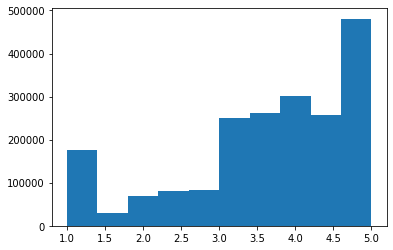

In [0]:
# Plot a histogram of the average_stars column
print(plt.hist(df_user['average_stars']))

In [0]:
# Read the review data from s3
file_location_review = "dbfs:/mnt/s3dataread/landing/yelp_academic_dataset_review.json"
df_review = spark.read.json(file_location_review)
df_review.show()

+--------------------+----+-------------------+-----+--------------------+-----+--------------------+------+--------------------+
|         business_id|cool|               date|funny|           review_id|stars|                text|useful|             user_id|
+--------------------+----+-------------------+-----+--------------------+-----+--------------------+------+--------------------+
|XQfwVwDr-v0ZS3_Cb...|   0|2018-07-07 22:09:11|    0|KU_O5udG6zpxOg-Vc...|  3.0|If you decide to ...|     0|mh_-eMZ6K5RLWhZyI...|
|7ATYjTIgM3jUlt4UM...|   1|2012-01-03 15:28:18|    0|BiTunyQ73aT9WBnpR...|  5.0|I've taken a lot ...|     1|OyoGAe7OKpv6SyGZT...|
|YjUWPpI6HXG530lwP...|   0|2014-02-05 20:30:30|    0|saUsX_uimxRlCVr67...|  3.0|Family diner. Had...|     0|8g_iMtfSiwikVnbP2...|
|kxX2SOes4o-D3ZQBk...|   1|2015-01-04 00:01:03|    0|AqPFMleE6RsU23_au...|  5.0|Wow!  Yummy, diff...|     1|_7bHUi9Uuf5__HHc_...|
|e4Vwtrqf-wpJfwesg...|   1|2017-01-14 20:54:15|    0|Sx8TMOWLNuJBWer-0...|  4.0|Cute inter

In [0]:
# Apply schema to the data
df_review.printSchema()

root
 |-- business_id: string (nullable = true)
 |-- cool: long (nullable = true)
 |-- date: string (nullable = true)
 |-- funny: long (nullable = true)
 |-- review_id: string (nullable = true)
 |-- stars: double (nullable = true)
 |-- text: string (nullable = true)
 |-- useful: long (nullable = true)
 |-- user_id: string (nullable = true)



In [0]:
# Count number of rows
df_review.count()

Out[10]: 6990280

In [0]:
# Get all columns names
df_review.columns

Out[11]: ['business_id',
 'cool',
 'date',
 'funny',
 'review_id',
 'stars',
 'text',
 'useful',
 'user_id']

In [0]:
# Get statistics of the numeric columns
df_review.select(["cool","funny","stars","useful"]).describe().show()

+-------+------------------+-------------------+------------------+------------------+
|summary|              cool|              funny|             stars|            useful|
+-------+------------------+-------------------+------------------+------------------+
|  count|           6990280|            6990280|           6990280|           6990280|
|   mean|0.4986175088837643|0.32655959417934616|  3.74858374771826|1.1846089140921394|
| stddev| 2.172459820211183| 1.6887290985540466|1.4787045052556833|3.2537669669333593|
|    min|                -1|                 -1|               1.0|                -1|
|    max|               404|                792|               5.0|              1182|
+-------+------------------+-------------------+------------------+------------------+



In [0]:
# Find missing value
from pyspark.sql.functions import isnan, when, count, col

df_review.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df_review.columns]).show()

+-----------+----+----+-----+---------+-----+----+------+-------+
|business_id|cool|date|funny|review_id|stars|text|useful|user_id|
+-----------+----+----+-----+---------+-----+----+------+-------+
|          0|   0|   0|    0|        0|    0|   0|     0|      0|
+-----------+----+----+-----+---------+-----+----+------+-------+



In [0]:
# List of columns to remove from dataset
cols_to_drop = ['cool', 'funny', 'useful']

# Drop columns in list
df_review = df_review.drop(*cols_to_drop)

df_review.show()

+--------------------+-------------------+--------------------+-----+--------------------+--------------------+
|         business_id|               date|           review_id|stars|                text|             user_id|
+--------------------+-------------------+--------------------+-----+--------------------+--------------------+
|XQfwVwDr-v0ZS3_Cb...|2018-07-07 22:09:11|KU_O5udG6zpxOg-Vc...|  3.0|If you decide to ...|mh_-eMZ6K5RLWhZyI...|
|7ATYjTIgM3jUlt4UM...|2012-01-03 15:28:18|BiTunyQ73aT9WBnpR...|  5.0|I've taken a lot ...|OyoGAe7OKpv6SyGZT...|
|YjUWPpI6HXG530lwP...|2014-02-05 20:30:30|saUsX_uimxRlCVr67...|  3.0|Family diner. Had...|8g_iMtfSiwikVnbP2...|
|kxX2SOes4o-D3ZQBk...|2015-01-04 00:01:03|AqPFMleE6RsU23_au...|  5.0|Wow!  Yummy, diff...|_7bHUi9Uuf5__HHc_...|
|e4Vwtrqf-wpJfwesg...|2017-01-14 20:54:15|Sx8TMOWLNuJBWer-0...|  4.0|Cute interior and...|bcjbaE6dDog4jkNY9...|
|04UD14gamNjLY0IDY...|2015-09-23 23:10:31|JrIxlS1TzJ-iCu79u...|  1.0|I am a long term ...|eUta8W_HdHMXPz

In [0]:
# Save the cleaned review data to s3
df_review.write.mode("overwrite").parquet("dbfs:/mnt/s3dataread/raw/review.parquet")

In [0]:
# Read the business data from s3
file_location_business = "dbfs:/mnt/s3dataread/landing/yelp_academic_dataset_business.json"
df_business = spark.read.json(file_location_business)
df_business.show(5)

+--------------------+--------------------+--------------------+--------------------+-------------+--------------------+-------+----------+------------+--------------------+-----------+------------+-----+-----+
|             address|          attributes|         business_id|          categories|         city|               hours|is_open|  latitude|   longitude|                name|postal_code|review_count|stars|state|
+--------------------+--------------------+--------------------+--------------------+-------------+--------------------+-------+----------+------------+--------------------+-----------+------------+-----+-----+
|1616 Chapala St, ...|{null, null, null...|Pns2l4eNsfO8kk83d...|Doctors, Traditio...|Santa Barbara|                null|      0|34.4266787|-119.7111968|Abby Rappoport, L...|      93101|           7|  5.0|   CA|
|87 Grasso Plaza S...|{null, null, null...|mpf3x-BjTdTEA3yCZ...|Shipping Centers,...|       Affton|{8:0-18:30, 0:0-0...|      1| 38.551126|  -90.335695|    

In [0]:
# Apply schema to the data
df_business.printSchema()

root
 |-- address: string (nullable = true)
 |-- attributes: struct (nullable = true)
 |    |-- AcceptsInsurance: string (nullable = true)
 |    |-- AgesAllowed: string (nullable = true)
 |    |-- Alcohol: string (nullable = true)
 |    |-- Ambience: string (nullable = true)
 |    |-- BYOB: string (nullable = true)
 |    |-- BYOBCorkage: string (nullable = true)
 |    |-- BestNights: string (nullable = true)
 |    |-- BikeParking: string (nullable = true)
 |    |-- BusinessAcceptsBitcoin: string (nullable = true)
 |    |-- BusinessAcceptsCreditCards: string (nullable = true)
 |    |-- BusinessParking: string (nullable = true)
 |    |-- ByAppointmentOnly: string (nullable = true)
 |    |-- Caters: string (nullable = true)
 |    |-- CoatCheck: string (nullable = true)
 |    |-- Corkage: string (nullable = true)
 |    |-- DietaryRestrictions: string (nullable = true)
 |    |-- DogsAllowed: string (nullable = true)
 |    |-- DriveThru: string (nullable = true)
 |    |-- GoodForDancing: str

In [0]:
# Count number of rows
df_business.count()

Out[82]: 150346

In [0]:
# Get all columns names
df_business.columns

Out[83]: ['address',
 'attributes',
 'business_id',
 'categories',
 'city',
 'hours',
 'is_open',
 'latitude',
 'longitude',
 'name',
 'postal_code',
 'review_count',
 'stars',
 'state']

In [0]:
#Convert the string into an array
df_business_array = df_business.withColumn("categories_splitted", split("categories", ","))

#Split the categories column into rows
df_business_splitted = df_business_array.select("business_id","is_open","latitude","longitude","city","postal_code","state","review_count","stars", explode("categories_splitted").alias("category"))

df_business_splitted.show()

+--------------------+-------+----------+------------+-------------+-----------+-----+------------+-----+--------------------+
|         business_id|is_open|  latitude|   longitude|         city|postal_code|state|review_count|stars|            category|
+--------------------+-------+----------+------------+-------------+-----------+-----+------------+-----+--------------------+
|Pns2l4eNsfO8kk83d...|      0|34.4266787|-119.7111968|Santa Barbara|      93101|   CA|           7|  5.0|             Doctors|
|Pns2l4eNsfO8kk83d...|      0|34.4266787|-119.7111968|Santa Barbara|      93101|   CA|           7|  5.0| Traditional Chin...|
|Pns2l4eNsfO8kk83d...|      0|34.4266787|-119.7111968|Santa Barbara|      93101|   CA|           7|  5.0| Naturopathic/Hol...|
|Pns2l4eNsfO8kk83d...|      0|34.4266787|-119.7111968|Santa Barbara|      93101|   CA|           7|  5.0|         Acupuncture|
|Pns2l4eNsfO8kk83d...|      0|34.4266787|-119.7111968|Santa Barbara|      93101|   CA|           7|  5.0|    He

In [0]:
# Find missing value
from pyspark.sql.functions import isnan, when, count, col

df_business_splitted.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df_business_splitted.columns]).show()

+-----------+-------+--------+---------+----+-----------+-----+------------+-----+--------+
|business_id|is_open|latitude|longitude|city|postal_code|state|review_count|stars|category|
+-----------+-------+--------+---------+----+-----------+-----+------------+-----+--------+
|          0|      0|       0|        0|   0|          0|    0|           0|    0|       0|
+-----------+-------+--------+---------+----+-----------+-----+------------+-----+--------+



In [0]:
# Save the cleaned business data to s3
df_business_splitted.write.mode("overwrite").parquet("dbfs:/mnt/s3dataread/raw/business.parquet")